# Описание проекта
Требуется разработать демонстрационную версию поиска изображений по запросу.

Для демонстрационной версии нужно обучить модель, которая получит векторное представление изображения, векторное представление текста, а на выходе выдаст число от 0 до 1 — покажет, насколько текст и картинка подходят друг другу.

В некоторых странах, где работает заказчик, действуют ограничения по обработке изображений: поисковым сервисам и сервисам, предоставляющим возможность поиска, запрещено без разрешения родителей или законных представителей предоставлять любую информацию, в том числе, но не исключительно тексты, изображения, видео и аудио, содержащие описание, изображение или запись голоса детей. Ребёнком считается любой человек, не достигший 16 лет.

В вашем сервисе строго следуют законам стран, в которых работают. Поэтому при попытке посмотреть изображения, запрещённые законодательством, вместо картинок показывается дисклеймер:

This image is unavailable in your country in compliance with local laws

Таке надо включить проверку, исключающую вывод запрещённого контента, в данном случае - изображений несовершеннолетних.


##  Описание данных
Данные лежат в папке /datasets/image_search/ или доступны по ссылке.
  
В файле train_dataset.csv находится информация, необходимая для обучения: имя файла изображения, идентификатор описания и текст описания. Для одной картинки может быть доступно до 5 описаний. Идентификатор описания имеет формат <имя файла изображения>#<порядковый номер описания>.
  
В папке train_images содержатся изображения для тренировки модели.
  
В файле CrowdAnnotations.tsv — данные по соответствию изображения и описания, полученные с помощью краудсорсинга. Номера колонок и соответствующий тип данных:

Имя файла изображения.  
Идентификатор описания.  
Доля людей, подтвердивших, что описание соответствует изображению.  
Количество человек, подтвердивших, что описание соответствует изображению.  
Количество человек, подтвердивших, что описание не соответствует изображению.  
В файле ExpertAnnotations.tsv содержатся данные по соответствию изображения и описания, полученные в результате опроса экспертов. Номера колонок и соответствующий тип данных:  

Имя файла изображения.  
Идентификатор описания.  
3, 4, 5 — оценки трёх экспертов.  
  
Эксперты ставят оценки по шкале от 1 до 4, где 1 — изображение и запрос совершенно не соответствуют друг другу, 2 — запрос содержит элементы описания изображения, но в целом запрос тексту не соответствует, 3 — запрос и текст соответствуют с точностью до некоторых деталей, 4 — запрос и текст соответствуют полностью.
  
В файле test_queries.csv находится информация, необходимая для тестирования: идентификатор запроса, текст запроса и релевантное изображение. Для одной картинки может быть доступно до 5 описаний. Идентификатор описания имеет формат <имя файла изображения>#<порядковый номер описания>.
  
В папке test_images содержатся изображения для тестирования модели.

## Интсрументы
keras  
BERT  
pandas  
CV2  
nltk  
sklearn  
Catboost  

<!-- vscode-markdown-toc -->

<!-- vscode-markdown-toc-config
	numbering=true
	autoSave=true
	/vscode-markdown-toc-config -->
<!-- /vscode-markdown-toc -->

!pip install tensorflow==2.10.0  
!pip install opencv-python   
!pip install pandas  
!pip install matplotlib  
!pip install seaborn  
!pip install scikit-learn  
!pip install nltk  
!pip install transformers  
!pip install tensorflow_hub  
!pip install tensorflow_text  
!pip install catboost


In [2]:
import pandas as pd
import cv2 as cv
import matplotlib.pyplot as plt
import numpy as np
import time
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.models import Model
from tensorflow.keras.callbacks import  ReduceLROnPlateau, EarlyStopping, ModelCheckpoint
from nltk.stem import WordNetLemmatizer
from sklearn.model_selection import GroupShuffleSplit
import numpy as np
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.optimizers import Adam
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from tqdm import tqdm
from transformers import BertTokenizer
import keras
import tensorflow_hub as hub
import nltk
from nltk.corpus import wordnet
import glob
from IPython.display import Image
from itertools import compress, product
from textwrap import wrap
from sklearn.metrics import mean_absolute_error
from sklearn.dummy import DummyRegressor
import random
from sklearn.preprocessing import StandardScaler
from catboost import CatBoostRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn import tree
from sklearn.linear_model import ElasticNet
from sklearn.linear_model import SGDRegressor


e:\Data\_Projects\.git\ISR\image-super-resolution\.venv\lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [3]:
nltk.download('words')

[nltk_data] Downloading package words to
[nltk_data]     C:\Users\Admin\AppData\Roaming\nltk_data...
[nltk_data]   Package words is already up-to-date!


True

# Загрузка данных

In [4]:
df_crowd = pd.read_csv ("E:/Data/_Projects/datasets/dsplus_integrated_project_4/to_upload/CrowdAnnotations.tsv", sep="\t")
df_crowd.columns=['file','id','share','matched','unmatched']
df_crowd.sample(5)


,file,id,share,matched,unmatched
31454,3354330935_de75be9d2f.jpg,2796801478_8ebd7e550b.jpg#2,0.0,0,3
10558,241345811_46b5f157d4.jpg,2933637854_984614e18b.jpg#2,0.0,0,3
37890,3582742297_1daa29968e.jpg,1517721825_10176d0683.jpg#2,0.0,0,3
34921,3482062809_3b694322c4.jpg,180506881_de0f59770f.jpg#2,0.0,0,4
919,1237985362_dbafc59280.jpg,2660008870_b672a4c76a.jpg#2,0.0,0,3


In [5]:
df_exp = pd.read_csv ("E:/Data/_Projects/datasets/dsplus_integrated_project_4/to_upload/ExpertAnnotations.tsv", sep="\t")
df_exp.columns=['file','id','exp1','exp2','exp3']
df_exp.sample(5)

,file,id,exp1,exp2,exp3
5782,925491651_57df3a5b36.jpg,1224851143_33bcdd299c.jpg#2,1,1,1
4166,3458559770_12cf9f134e.jpg,2061354254_faa5bd294b.jpg#2,1,1,1
4425,3523559027_a65619a34b.jpg,415793623_6c1225ae27.jpg#2,1,1,1
3921,3375070563_3c290a7991.jpg,3567061016_62768dcce1.jpg#2,4,4,4
2287,2844018783_524b08e5aa.jpg,1917265421_aeccf1ca38.jpg#2,1,2,2


In [6]:
train_df=pd.read_csv("E:/Data/_Projects/datasets/dsplus_integrated_project_4/to_upload/train_dataset.csv",sep=',')
train_df.columns=['file','id','query_text']
train_df.sample(5)

,file,id,query_text
1623,136552115_6dc3e7231c.jpg,302983277_69a4e732e4.jpg#2,A man riding a brown horse poses in front of a...
2652,2677656448_6b7e7702af.jpg,421322723_3470543368.jpg#2,A man wearing a green shirt looks down at a ce...
3094,2646116932_232573f030.jpg,136552115_6dc3e7231c.jpg#2,A mountain biker is jumping his bike over a ro...
4138,2196846255_2c1635359a.jpg,2308271254_27fb466eb4.jpg#2,Two dogs moving through water close to the sho...
1402,3301811927_a2797339e5.jpg,494921598_af73bda568.jpg#2,A youth playing hockey .


Столбец id выглядит сонительно, так как в описании задачи сказано, что он должен иметь формат "имя файла"+"номер описания", но по факту они все кончаются на #2, и номер в id никак не связан с именем файла. Посмотрим скозной пример по нескольким id.

In [7]:
#Напишем функцию для визуализации изображений
def show_scored_images(df,col):
    d=df.copy()
    for i in d[col].unique():
        sub=d[d[col]==i]
        
        sub=sub[[col,'file','query_text']]
        sub=sub.drop_duplicates()
        fig = plt.figure(figsize=(9,5))
        print(col,"=",i)
        le=min(5,len(sub))
        for j in range(le):
            idx=random.randint(1,len(sub))-1
            query=str(sub.iloc[idx]['query_text'])
            fig.add_subplot(1, 5, j+1)
            img=cv.imread("E:\\Data\\_Projects\\datasets\\dsplus_integrated_project_4\\to_upload\\train_images\\"+str(sub.iloc[idx]['file']))
            img = cv.cvtColor(img, cv.COLOR_BGR2RGB)
            plt.imshow(img)
            plt.xticks([])
            plt.yticks([])
            plt.tight_layout()
            plt.title(label="\n".join(wrap(query,25)),loc='center', fontsize=8, fontweight='light', pad=10)
            #plt.show()
        plt.show()    
        


In [8]:
df=pd.merge(train_df, df_exp, how='left', left_on='id', right_on='id')
df=pd.merge(df, df_crowd, how='left', left_on='id', right_on='id')
df=df[['file','id','query_text','exp1','exp2','exp3','share','matched','unmatched']]
df

,file,id,query_text,exp1,exp2,exp3,share,matched,unmatched
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,1,1,1,0.0,0,3
1,106490881_5a2dd9b7bd.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,1,1,1,0.0,0,3
2,1224851143_33bcdd299c.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,1,1,1,0.0,0,3
3,1237985362_dbafc59280.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,1,1,1,0.0,0,3
4,1287475186_2dee85f1a5.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,1,1,1,0.0,0,3
...,...,...,...,...,...,...,...,...,...
2656912,510531976_90bbee22a2.jpg,2292406847_f366350600.jpg#2,A man rows his boat below .,1,1,1,0.0,0,3
2656913,53043785_c468d6f931.jpg,2292406847_f366350600.jpg#2,A man rows his boat below .,1,1,1,0.0,0,3
2656914,535830521_aa971319fc.jpg,2292406847_f366350600.jpg#2,A man rows his boat below .,1,1,1,0.0,0,3
2656915,70995350_75d0698839.jpg,2292406847_f366350600.jpg#2,A man rows his boat below .,1,1,1,0.0,0,3


In [9]:
df=df.drop_duplicates()

# Знакомство с датасетом

In [10]:
df.isna().sum()

file          0
id            0
query_text    0
exp1          0
exp2          0
exp3          0
share         0
matched       0
unmatched     0
dtype: int64

In [11]:
pd.set_option('display.expand_frame_repr', False)
df.describe

<bound method NDFrame.describe of                               file                           id                                         query_text  exp1  exp2  exp3  share  matched  unmatched
0        1056338697_4f7d7ce270.jpg  2549968784_39bfbe44f9.jpg#2  A young child is wearing blue goggles and sitt...     1     1     1    0.0        0          3
1         106490881_5a2dd9b7bd.jpg  2549968784_39bfbe44f9.jpg#2  A young child is wearing blue goggles and sitt...     1     1     1    0.0        0          3
2        1224851143_33bcdd299c.jpg  2549968784_39bfbe44f9.jpg#2  A young child is wearing blue goggles and sitt...     1     1     1    0.0        0          3
3        1237985362_dbafc59280.jpg  2549968784_39bfbe44f9.jpg#2  A young child is wearing blue goggles and sitt...     1     1     1    0.0        0          3
4        1287475186_2dee85f1a5.jpg  2549968784_39bfbe44f9.jpg#2  A young child is wearing blue goggles and sitt...     1     1     1    0.0        0          3
...   

In [12]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 160054 entries, 0 to 2656916
Data columns (total 9 columns):
 #   Column      Non-Null Count   Dtype  
---  ------      --------------   -----  
 0   file        160054 non-null  object 
 1   id          160054 non-null  object 
 2   query_text  160054 non-null  object 
 3   exp1        160054 non-null  int64  
 4   exp2        160054 non-null  int64  
 5   exp3        160054 non-null  int64  
 6   share       160054 non-null  float64
 7   matched     160054 non-null  int64  
 8   unmatched   160054 non-null  int64  
dtypes: float64(1), int64(5), object(3)
memory usage: 12.2+ MB


exp1 = 1


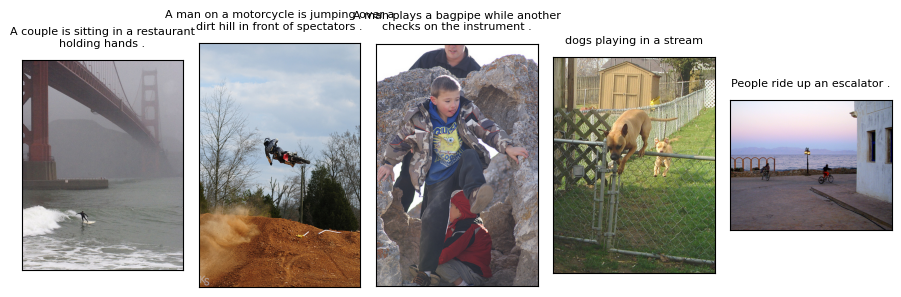

exp1 = 4


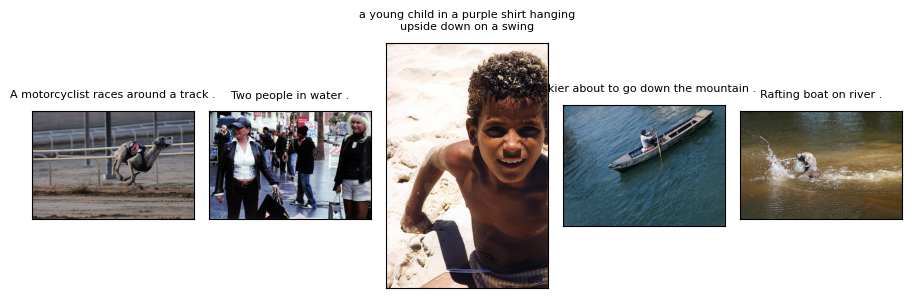

exp1 = 2


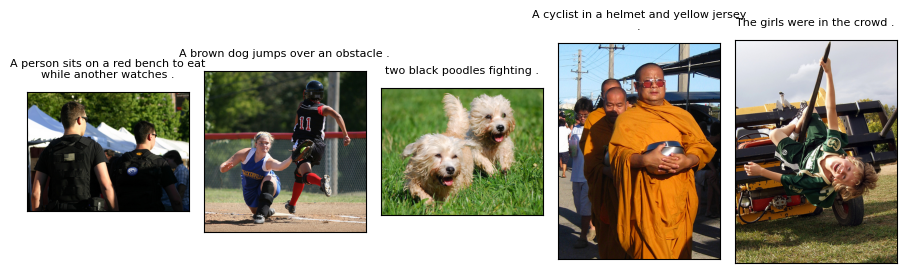

exp1 = 3


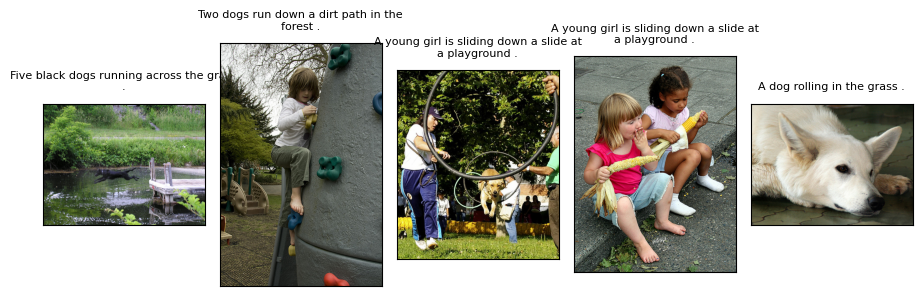

In [13]:
show_scored_images(df,'exp1')

Такое ощущение, что оценки первого эксперта имеют случайный характер.

exp2 = 1


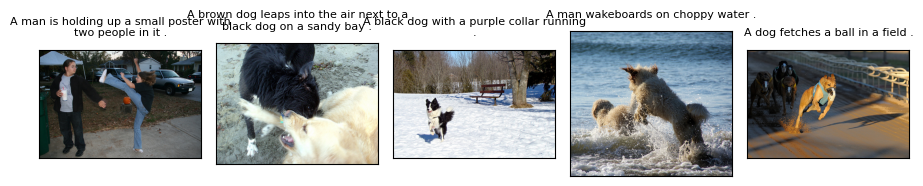

exp2 = 2


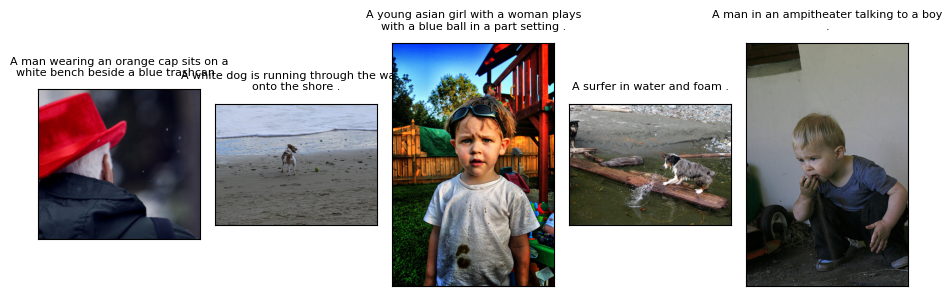

exp2 = 4


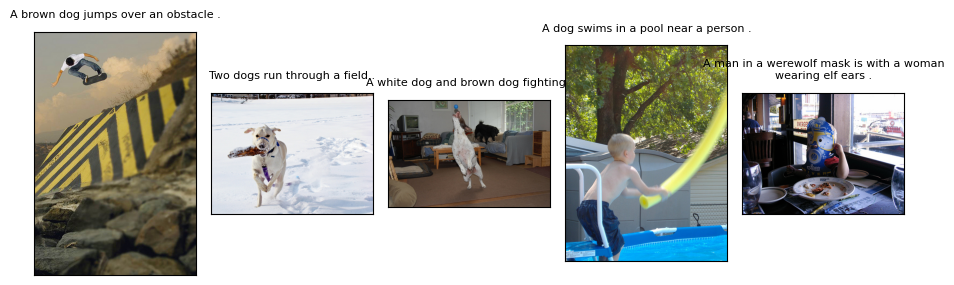

exp2 = 3


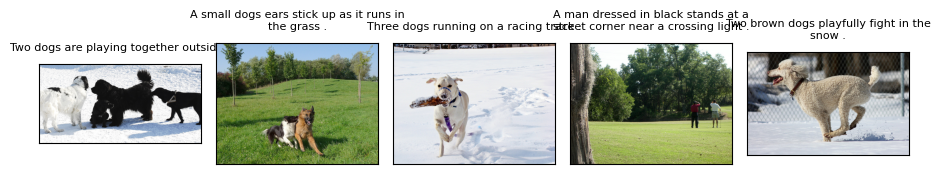

In [14]:
show_scored_images(df,'exp2')

Показания второго эксперта немногим лучше, и тоже тяготеют к случайноси.

exp3 = 1


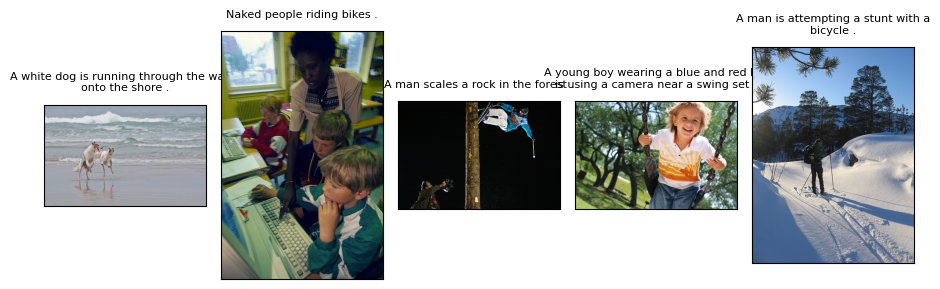

exp3 = 2


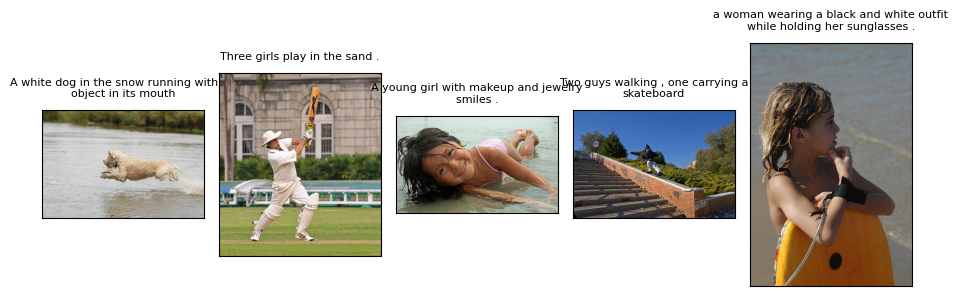

exp3 = 4


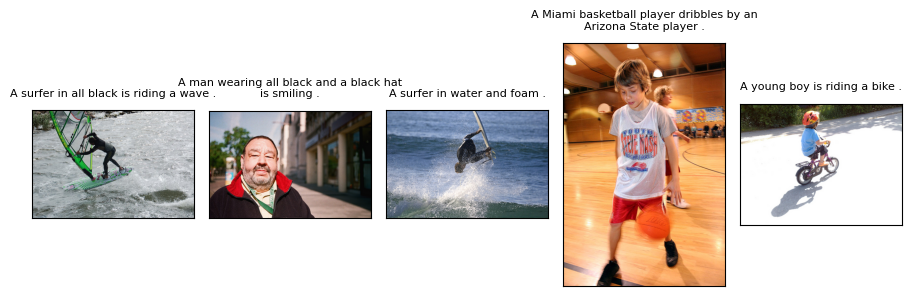

exp3 = 3


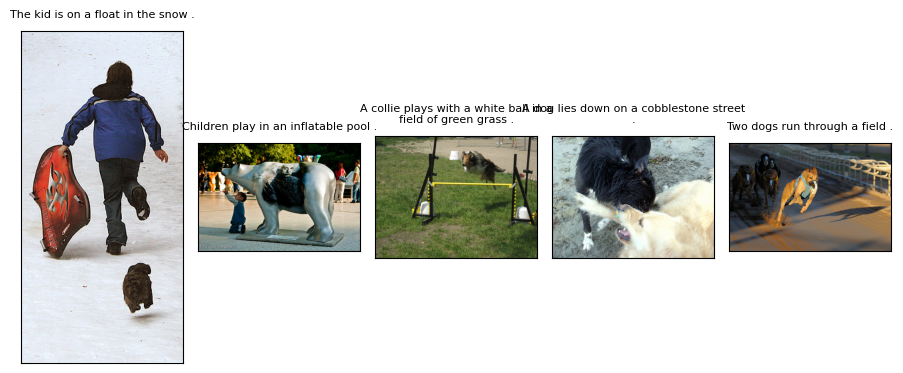

In [15]:
show_scored_images(df,'exp3')

Третий эксперт отрабатывает несколько лучше, чем первые два.

share = 0.0


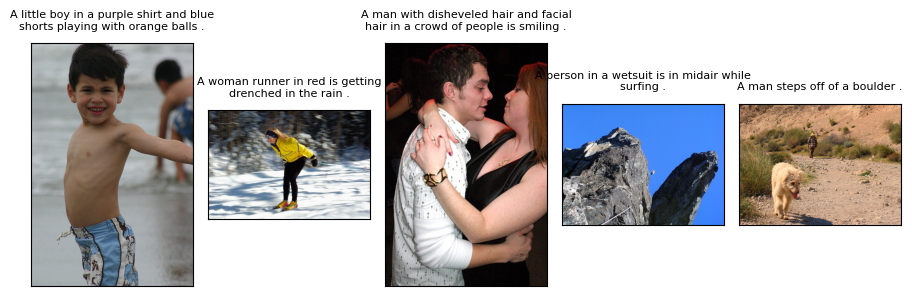

share = 1.0


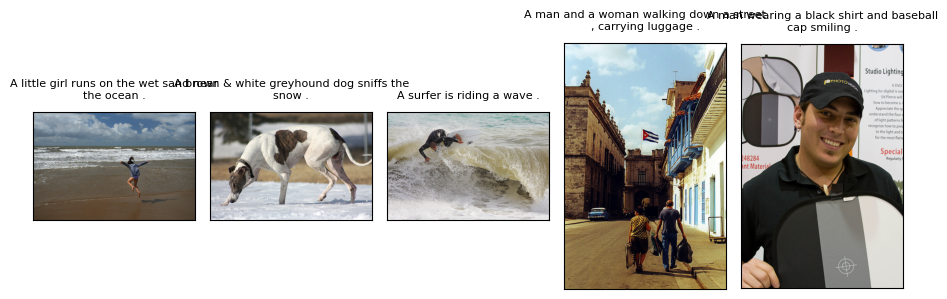

share = 0.333333333333333


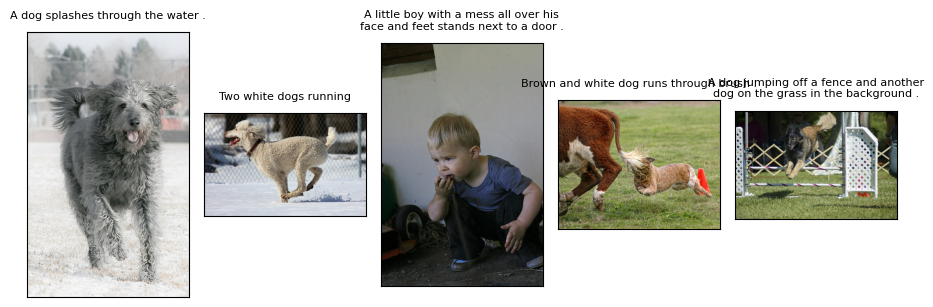

share = 0.666666666666667


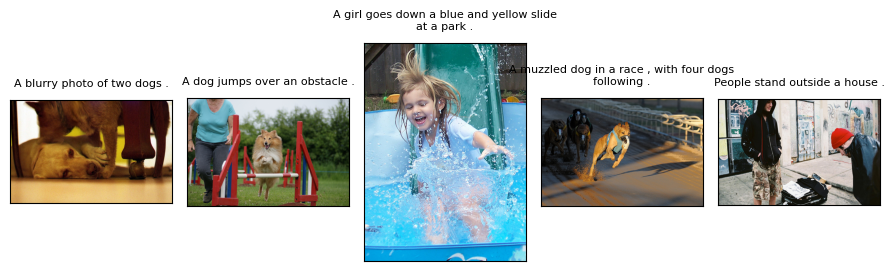

share = 0.25


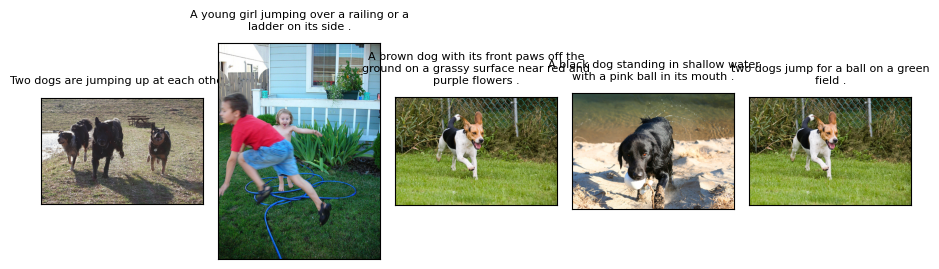

share = 0.5


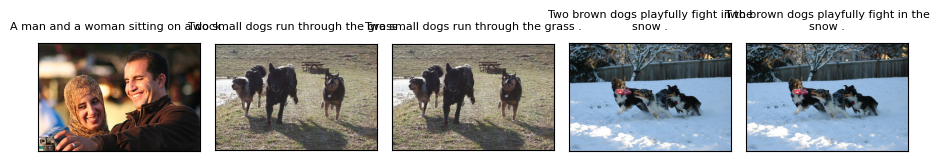

share = 0.75


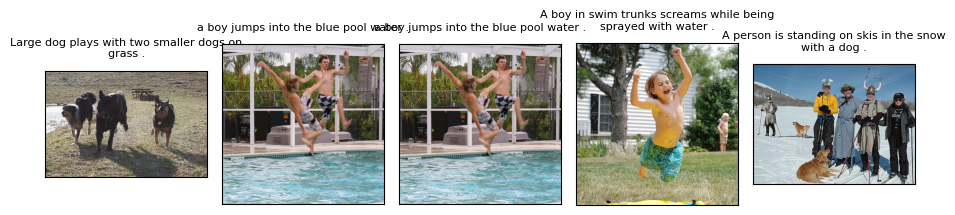

share = 0.2


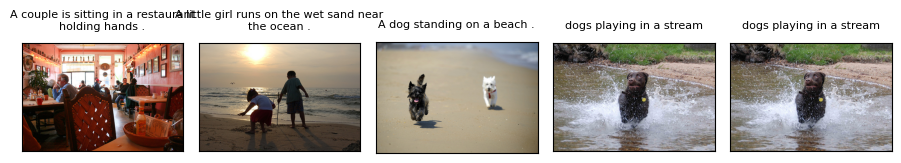

share = 0.4


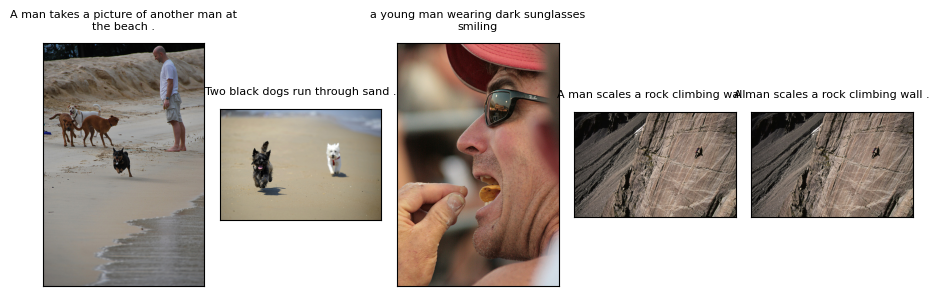

share = 0.8


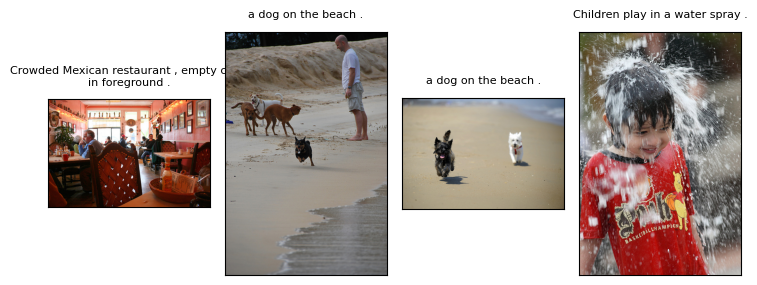

share = 0.6


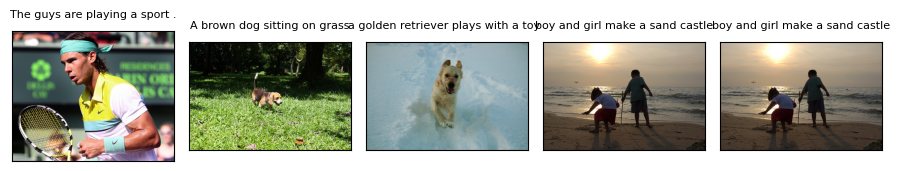

share = 0.166666666666667


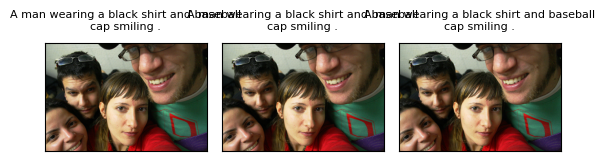

In [16]:
show_scored_images(df,'share')

Толпа тоже ошибается, но в целом их оценком можно доверять.
Напрашивается вывод, что можно сделать комбинированную оценку из показаний толпы с лёгим бонусом за высокую оценку 3-м экспертом.

In [17]:
df['exp_sum']=df.apply(lambda row: sum(row[['exp1', 'exp2', 'exp3']]), axis=1)
df

C:\Users\Admin\AppData\Local\Temp\ipykernel_4904\1334148583.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['exp_sum']=df.apply(lambda row: sum(row[['exp1', 'exp2', 'exp3']]), axis=1)


,file,id,query_text,exp1,exp2,exp3,share,matched,unmatched,exp_sum
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,1,1,1,0.0,0,3,3
1,106490881_5a2dd9b7bd.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,1,1,1,0.0,0,3,3
2,1224851143_33bcdd299c.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,1,1,1,0.0,0,3,3
3,1237985362_dbafc59280.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,1,1,1,0.0,0,3,3
4,1287475186_2dee85f1a5.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,1,1,1,0.0,0,3,3
...,...,...,...,...,...,...,...,...,...,...
2656912,510531976_90bbee22a2.jpg,2292406847_f366350600.jpg#2,A man rows his boat below .,1,1,1,0.0,0,3,3
2656913,53043785_c468d6f931.jpg,2292406847_f366350600.jpg#2,A man rows his boat below .,1,1,1,0.0,0,3,3
2656914,535830521_aa971319fc.jpg,2292406847_f366350600.jpg#2,A man rows his boat below .,1,1,1,0.0,0,3,3
2656915,70995350_75d0698839.jpg,2292406847_f366350600.jpg#2,A man rows his boat below .,1,1,1,0.0,0,3,3


In [18]:

df['score']=df['share']+(df['exp3']-2)*0.1
#df['score']=df['exp_sum'].apply(lambda x: 1 if x>0 else 0)
df

C:\Users\Admin\AppData\Local\Temp\ipykernel_4904\1516851667.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['score']=df['share']+(df['exp3']-2)*0.1


,file,id,query_text,exp1,exp2,exp3,share,matched,unmatched,exp_sum,score
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,1,1,1,0.0,0,3,3,-0.1
1,106490881_5a2dd9b7bd.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,1,1,1,0.0,0,3,3,-0.1
2,1224851143_33bcdd299c.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,1,1,1,0.0,0,3,3,-0.1
3,1237985362_dbafc59280.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,1,1,1,0.0,0,3,3,-0.1
4,1287475186_2dee85f1a5.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,1,1,1,0.0,0,3,3,-0.1
...,...,...,...,...,...,...,...,...,...,...,...
2656912,510531976_90bbee22a2.jpg,2292406847_f366350600.jpg#2,A man rows his boat below .,1,1,1,0.0,0,3,3,-0.1
2656913,53043785_c468d6f931.jpg,2292406847_f366350600.jpg#2,A man rows his boat below .,1,1,1,0.0,0,3,3,-0.1
2656914,535830521_aa971319fc.jpg,2292406847_f366350600.jpg#2,A man rows his boat below .,1,1,1,0.0,0,3,3,-0.1
2656915,70995350_75d0698839.jpg,2292406847_f366350600.jpg#2,A man rows his boat below .,1,1,1,0.0,0,3,3,-0.1


<Axes: >

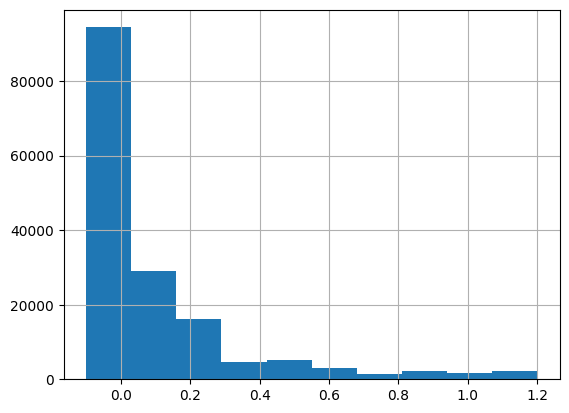

In [19]:
df['score'].hist(bins=10)

В результате ммы получили достаточно гармоничный график, с пиком в районе нуля, так как из всех описаний к картинкам реально подходят лишь немногие, потом идёт резкий почти гиперболический спуск к и где-то с 0,6 до 1.2 мы имеем что-то вроде плато, для более подходящих описаний. Убедимся, что там и прада есть что-то хорошее.

score = 0.9


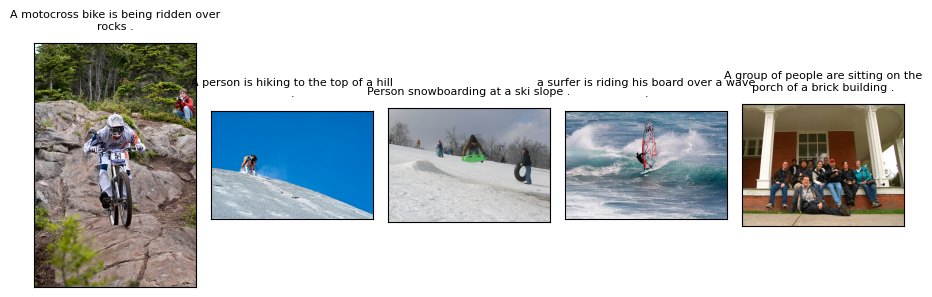

score = 1.0


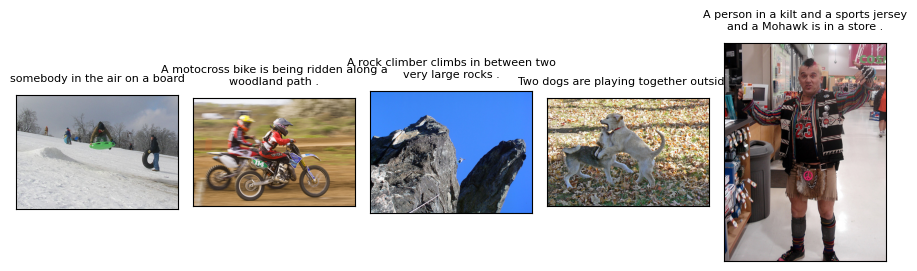

score = 1.2


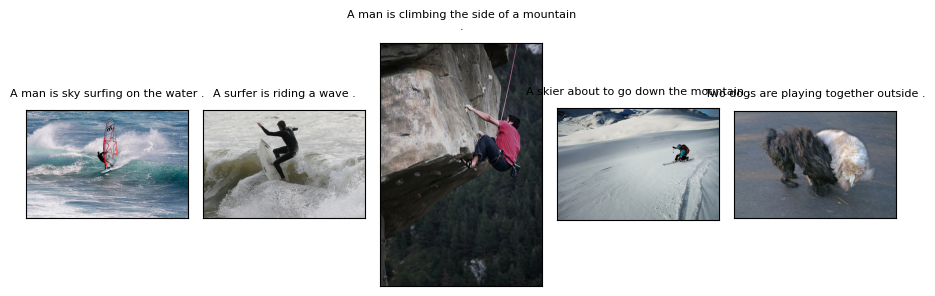

score = 1.1


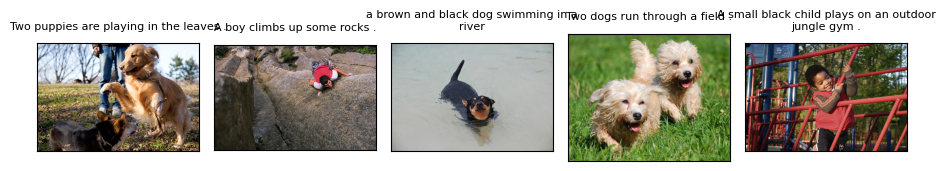

score = 0.8666666666666669


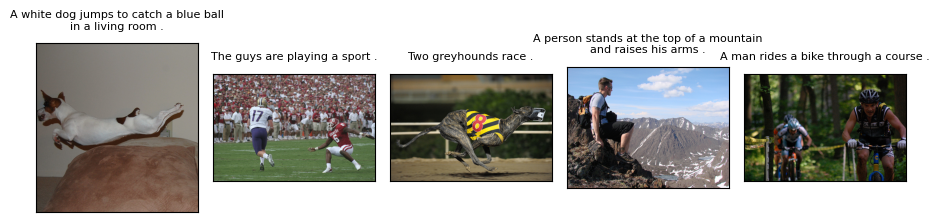

score = 0.85


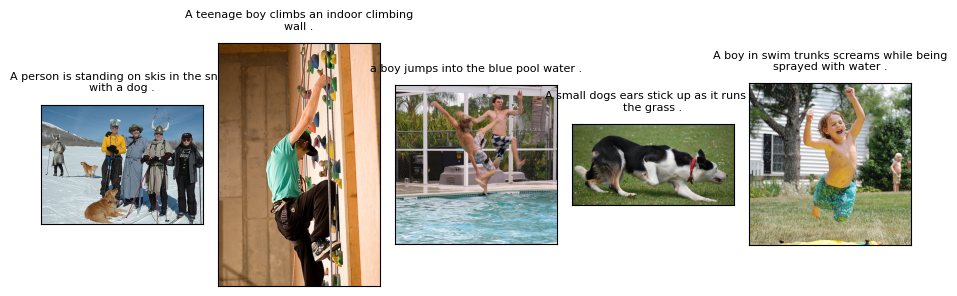

score = 0.95


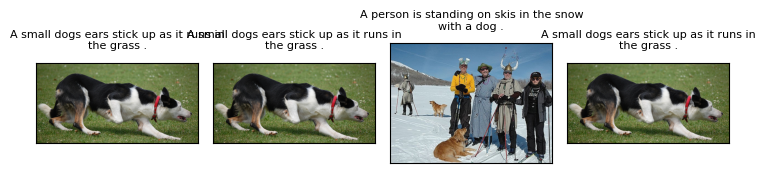

In [20]:
sub=df[df['score']>0.8]
show_scored_images(sub,'score')

Да, мы смогли добиться комбинированных оценок, которые весьма неплохо подходят к картинкам. На такие данных наша модель уже чему-то сможет научиться.

## Фильтрация детского контента

In [21]:
seed=43
random.seed(seed)
np.random.seed(seed)
tf.random.set_seed(seed)

In [22]:
#Созданим функцию, находящую синонимы к слову "child", для реализации фильтра запрещённого контента
def find_synonyms(word):
    synonyms = set()
    # Получаем список синонимов для заданного слова
    for syn in wordnet.synsets(word):
        st=str(syn.name())[:-5]
        synonyms.add(st)
    
    return synonyms

In [23]:
stopset={'adolescent',
            'boy',
            'child',
            'daughter',
            'female_child',
            'girl',
            'girlfriend',
            'junior',
            'kid',
            'kyd',
            'male_child',
            'minor',
            'offspring',
            'pull_the_leg_of',
            'son',
            'toddler',
            'underage',
            'young','kids','boys','girls','youngsters','teenager','teenagers','toddlers'}

In [24]:
lemmatizer = WordNetLemmatizer()

In [25]:
def content_filter(df):
    df['lemmatized_query_text']=df['query_text'].apply(lambda x: ' '.join([lemmatizer.lemmatize(word) for word in x.split()]))
    df['lemmatized_query_text']=df['lemmatized_query_text'].apply(lambda x: x.lower())
    df['is_censored']= df['lemmatized_query_text'].apply(lambda x: 1 if any(word in stopset for word in x.split()) else 0)
    return df

In [26]:
df=content_filter(df)

C:\Users\Admin\AppData\Local\Temp\ipykernel_4904\2927020106.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['lemmatized_query_text']=df['query_text'].apply(lambda x: ' '.join([lemmatizer.lemmatize(word) for word in x.split()]))
C:\Users\Admin\AppData\Local\Temp\ipykernel_4904\2927020106.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['lemmatized_query_text']=df['lemmatized_query_text'].apply(lambda x: x.lower())
C:\Users\Admin\AppData\Local\Temp\ipykernel_4904\2927020106.py:4: SettingWithCopyW

In [27]:
df[df['is_censored']==1]['query_text'].unique()

array(['A young child is wearing blue goggles and sitting in a float in a pool .',
       'A girl wearing a yellow shirt and sunglasses smiles .',
       'A young boy dressed in a red uniform kicks the soccer ball on the field as another child in blue watches from behind .',
       'A little boy shakes the snow off of a tree .',
       'The kid is on a float in the snow .',
       'A little girl wearing sunglasses puts her feet into the kitchen sink .',
       'A young boy in a swimming suit sits in water .',
       'A child is preparing to slide down a piece of playground equipment .',
       'A man and young girl eat a meal on a city street .',
       'A young boy kicks a soccer ball while six others play but are dressed as referee .',
       'A little girl with mud on her face cries .',
       'Two little girls dance on a hardwood floor in the house .',
       'Two little children and one is playing with a slinky .',
       'Little girl in bare feet sitting in a circle .',
       'A

Теперь мы разметили датасет, и знаем какие картинки нельзя покаывать пользователям. Будет учитывать это при выводе результатов работы модели.

# Векторизация изображений и текстовых описаний

## Векторизация изображений

In [28]:
#Загрузим предобученную модель на базе imagenet
base_model = ResNet50(weights='imagenet')
vectorizer = Model(inputs=base_model.input, outputs=base_model.get_layer('avg_pool').output)


In [29]:
def verctorize_files(dir='E:\\Data\\_Projects\\datasets\\dsplus_integrated_project_4\\to_upload\\train_images\\'):
    IMAGE_SIZE = 224
    data_dir = dir
    image_files = glob.glob(data_dir + '*.jpg')

    images = []
    for image_file in tqdm(image_files):
        image = cv.imread(image_file)
        image_array = cv.resize(image, (IMAGE_SIZE, IMAGE_SIZE))
        image_array = image_array.reshape(-1, IMAGE_SIZE, IMAGE_SIZE, 3)
        images.append(image_array)

    images = np.asarray(images)
    images_reshaped = images.reshape((images.shape[0], IMAGE_SIZE, IMAGE_SIZE, 3))
    features = vectorizer.predict(images_reshaped,verbose=2)
    img_df=pd.DataFrame()
    img_df['img_features'] = [np.array(y) for y in features]
    img_df['path']=image_files
    img_df['file']=img_df['path'].apply(lambda x: x.split('\\')[-1])
    return img_df




In [30]:
img_df=verctorize_files(dir='E:\\Data\\_Projects\\datasets\\dsplus_integrated_project_4\\to_upload\\train_images\\')

100%|██████████| 1000/1000 [00:04<00:00, 211.07it/s]


32/32 - 24s - 24s/epoch - 757ms/step


## Векторизация текстовых описаний

In [31]:
tokenizer = BertTokenizer.from_pretrained('bert-base-uncased',
                                          do_lower_case=True)

In [32]:
def vextrize_description(df):
    encoder_train = tokenizer.batch_encode_plus(df['lemmatized_query_text'].values,
                                           add_special_tokens = True,
                                            return_attention_mask = True,
                                           pad_to_max_length = True,
                                            truncation=True,
                                           max_length = 16,
                                           return_tensors = 'tf')
    input_ids_train = encoder_train['input_ids']
    df['text_features'] = input_ids_train.numpy().tolist()
    #df = df.rename(columns={'image': 'file'})
    return df

In [33]:
df=vextrize_description(df)
df.head(3)

e:\Data\_Projects\.git\ISR\image-super-resolution\.venv\lib\site-packages\transformers\tokenization_utils_base.py:2619: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  warnings.warn(
C:\Users\Admin\AppData\Local\Temp\ipykernel_4904\210482115.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['text_features'] = input_ids_train.numpy().tolist()


,file,id,query_text,exp1,exp2,exp3,share,matched,unmatched,exp_sum,score,lemmatized_query_text,is_censored,text_features
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,1,1,1,0.0,0,3,3,-0.1,a young child is wearing blue goggles and sitt...,1,"[101, 1037, 2402, 2775, 2003, 4147, 2630, 2175..."
1,106490881_5a2dd9b7bd.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,1,1,1,0.0,0,3,3,-0.1,a young child is wearing blue goggles and sitt...,1,"[101, 1037, 2402, 2775, 2003, 4147, 2630, 2175..."
2,1224851143_33bcdd299c.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,1,1,1,0.0,0,3,3,-0.1,a young child is wearing blue goggles and sitt...,1,"[101, 1037, 2402, 2775, 2003, 4147, 2630, 2175..."


In [34]:
result = pd.merge(df, img_df, how="left", on="file")
result.head()

,file,id,query_text,exp1,exp2,exp3,share,matched,unmatched,exp_sum,score,lemmatized_query_text,is_censored,text_features,img_features,path
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,1,1,1,0.0,0,3,3,-0.1,a young child is wearing blue goggles and sitt...,1,"[101, 1037, 2402, 2775, 2003, 4147, 2630, 2175...","[0.39676273, 0.0, 0.0, 0.9925282, 0.016766436,...",E:\Data\_Projects\datasets\dsplus_integrated_p...
1,106490881_5a2dd9b7bd.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,1,1,1,0.0,0,3,3,-0.1,a young child is wearing blue goggles and sitt...,1,"[101, 1037, 2402, 2775, 2003, 4147, 2630, 2175...","[0.08235271, 0.007252924, 0.0, 0.14435348, 0.3...",E:\Data\_Projects\datasets\dsplus_integrated_p...
2,1224851143_33bcdd299c.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,1,1,1,0.0,0,3,3,-0.1,a young child is wearing blue goggles and sitt...,1,"[101, 1037, 2402, 2775, 2003, 4147, 2630, 2175...","[0.9311204, 0.20765595, 0.5200591, 1.7603301, ...",E:\Data\_Projects\datasets\dsplus_integrated_p...
3,1237985362_dbafc59280.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,1,1,1,0.0,0,3,3,-0.1,a young child is wearing blue goggles and sitt...,1,"[101, 1037, 2402, 2775, 2003, 4147, 2630, 2175...","[0.9152229, 0.61306894, 0.0, 0.29946598, 0.0, ...",E:\Data\_Projects\datasets\dsplus_integrated_p...
4,1287475186_2dee85f1a5.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,1,1,1,0.0,0,3,3,-0.1,a young child is wearing blue goggles and sitt...,1,"[101, 1037, 2402, 2775, 2003, 4147, 2630, 2175...","[0.20944089, 0.12645538, 0.7601613, 0.3215605,...",E:\Data\_Projects\datasets\dsplus_integrated_p...


*Вывод*:  
Теперь у нас есть единый датасет, где каждой картинке и каждому текстовому описанию присвое вектор, подходящий для машинного обучения, и есть целевая переменная, показывающая, насколько хорошо они соответствуют друг-другу.


# Моделирование

## Разделим выборку на обучающий и тестовый набор

In [35]:
gss = GroupShuffleSplit(n_splits=1, train_size=.7, random_state=42)

In [36]:
train_index, test_index=next(gss.split(X=result[['img_features','text_features']], y=result['score'], groups=result['file']))
X_text_train=result.iloc[train_index]['text_features']
X_img_train=result.iloc[train_index]['img_features']
X_text_test=result.iloc[test_index]['text_features']
X_img_test=result.iloc[test_index]['img_features']

y_train=result.iloc[train_index]['score']
y_test=result.iloc[test_index]['score']


In [37]:
X_text_train=np.array([np.array(xi) for xi in X_text_train])
X_img_train=np.array([np.array(xi) for xi in X_img_train])
X_text_test=np.array([np.array(xi) for xi in X_text_test])
X_img_test=np.array([np.array(xi) for xi in X_img_test])

In [38]:
dum_tr_X=np.concatenate((X_img_train,X_text_train), axis = 1)
dum_te_X=np.concatenate((X_img_test,X_text_test), axis = 1)

In [39]:
sc=StandardScaler()
dum_tr_X=sc.fit_transform(dum_tr_X)
dum_te_X=sc.transform(dum_te_X)

## Создание модели

In [40]:
dict_classifiers = {
    #"GradientBoostingRegressor": GradientBoostingRegressor(),
    "Nearest Neighbors": KNeighborsRegressor(),
    "Decision Tree": tree.DecisionTreeRegressor(),
    "ElasticNet": ElasticNet(),
    "SGDRegressor": SGDRegressor(),
    "CatBoost":CatBoostRegressor(verbose=0),
    "Dummny:mean":DummyRegressor(strategy='mean'),
    "Dummny:median":DummyRegressor(strategy='median'),
    "Dummny:quantile":DummyRegressor(strategy='quantile',quantile=0.75),
    "Dummny:constant":DummyRegressor(strategy='constant',constant=0.398)
}


In [41]:
dict_models = {}
for classifier_name, classifier in list(dict_classifiers.items()):
    t_start = time.time()
    classifier.fit(dum_tr_X, y_train)
    t_end = time.time()
        
    t_diff = t_end - t_start
    yp=classifier.predict(dum_te_X)
    test_score = mean_absolute_error(y_test,yp)
        
    dict_models[classifier_name] = {'model': classifier, 'test_MAE': test_score, 'train_time': t_diff}
    print("trained {c} in {f:.2f} s".format(c=classifier_name, f=t_diff))

trained Nearest Neighbors in 0.18 s
trained Decision Tree in 104.98 s
trained ElasticNet in 3.11 s
trained SGDRegressor in 4.89 s
trained CatBoost in 164.59 s
trained Dummny:mean in 0.00 s
trained Dummny:median in 0.00 s
trained Dummny:quantile in 0.00 s
trained Dummny:constant in 0.00 s


In [42]:
def display_dict_models(dict_models, sort_by='test_MAE'):
    cls = [key for key in dict_models.keys()]
    test_s = [dict_models[key]['test_MAE'] for key in cls]
    training_t = [dict_models[key]['train_time'] for key in cls]
    
    df_ = pd.DataFrame(data=np.zeros(shape=(len(cls),3)), columns = ['classifier', 'test_MAE', 'train_time'])
    for ii in range(0,len(cls)):
        df_.loc[ii, 'classifier'] = cls[ii]
        df_.loc[ii, 'test_MAE'] = test_s[ii]
        df_.loc[ii, 'train_time'] = training_t[ii]
    
    display(df_.sort_values(by=sort_by, ascending=False))

In [43]:
display_dict_models(dict_models)

,classifier,test_MAE,train_time
8,Dummny:constant,0.367443,0.000996
1,Decision Tree,0.193399,104.977090
3,SGDRegressor,0.187619,4.894738
0,Nearest Neighbors,0.178725,0.176420
2,ElasticNet,0.160561,3.110364
5,Dummny:mean,0.160561,0.000000
7,Dummny:quantile,0.159979,0.000000
4,CatBoost,0.142131,164.587029
6,Dummny:median,0.140494,0.000999


In [44]:
image_input = tf.keras.Input(shape=(2048,))
text_input = tf.keras.Input(shape=(16,))
# Concatenate image and text vectors
concatenated = tf.keras.layers.Concatenate()([image_input, text_input])
norm = tf.keras.layers.Normalization(axis=None)(concatenated)
# Fully connected layers for matching
x = tf.keras.layers.Dense(512, activation='relu')(norm)
output = tf.keras.layers.Dense(1, activation='linear')(x)
model = tf.keras.Model(inputs=[image_input, text_input], outputs=output)

In [45]:
optimizer = Adam(learning_rate=0.01)
model.compile(optimizer=optimizer, loss='mean_absolute_error', metrics=['mae'])

In [46]:
epochs=300
steps_per_epoch=1
validation_steps=1

In [47]:
checkpointer = ModelCheckpoint(filepath='E:/Data/_Projects/datasets/pic_by_promt_model_v3.hdf5', monitor = "val_mae", verbose=1, save_best_only=True, mode = 'min')
reduce_lr = ReduceLROnPlateau(min_delta=0.1, patience=10, verbose=2)
early_stop = EarlyStopping(monitor='val_mae', min_delta=0.01, mode="auto", patience=25,verbose=2)
history=model.fit(x=[X_img_train,X_text_train], y=y_train,
    validation_data=([X_img_test,X_text_test],y_test),
    epochs=epochs, 
    steps_per_epoch=steps_per_epoch,
    validation_steps=validation_steps,
    verbose=2, callbacks=[reduce_lr,early_stop,checkpointer])

Epoch 1/300

Epoch 1: val_mae improved from inf to 2240.74097, saving model to E:/Data/_Projects/datasets\pic_by_promt_model_v3.hdf5
1/1 - 4s - loss: 315.2641 - mae: 315.2641 - val_loss: 2240.7410 - val_mae: 2240.7410 - lr: 0.0100 - 4s/epoch - 4s/step
Epoch 2/300

Epoch 2: val_mae did not improve from 2240.74097
1/1 - 1s - loss: 2252.6814 - mae: 2252.6814 - val_loss: 2592.9692 - val_mae: 2592.9692 - lr: 0.0100 - 1s/epoch - 1s/step
Epoch 3/300

Epoch 3: val_mae improved from 2240.74097 to 1667.75757, saving model to E:/Data/_Projects/datasets\pic_by_promt_model_v3.hdf5
1/1 - 1s - loss: 2597.1313 - mae: 2597.1313 - val_loss: 1667.7576 - val_mae: 1667.7576 - lr: 0.0100 - 1s/epoch - 1s/step
Epoch 4/300

Epoch 4: val_mae improved from 1667.75757 to 960.60242, saving model to E:/Data/_Projects/datasets\pic_by_promt_model_v3.hdf5
1/1 - 1s - loss: 1676.1686 - mae: 1676.1686 - val_loss: 960.6024 - val_mae: 960.6024 - lr: 0.0100 - 1s/epoch - 1s/step
Epoch 5/300

Epoch 5: val_mae did not improve 

In [48]:
model.load_weights('E:/Data/_Projects/datasets/pic_by_promt_model_v3.hdf5')

In [49]:
predz=model.predict([X_img_test,X_text_test])
test_df=result.iloc[test_index]
test_df['predict']=predz

1503/1503 [==============================] - 2s 1ms/step


C:\Users\Admin\AppData\Local\Temp\ipykernel_4904\1135851773.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_df['predict']=predz


In [50]:
mean_absolute_error(y_test, predz)

0.24541544159230755

In [51]:
test_df=test_df.sort_values(by='predict',ascending=False)


In [52]:
def show_examples(vdff):
    fig = plt.figure(figsize=(18,10))
    i=0
    for query in vdff['query_text'].unique()[:20]:
        forecasts=vdff[vdff['query_text']==query]

        maax=max(forecasts['predict'])
        goal=forecasts[forecasts['predict']==maax]
        fig.add_subplot(4, 5, i+1)
        if goal['is_censored'].values[0]==0:
            out=goal['path'].values[0]
            img=cv.imread(out)
            img = cv.cvtColor(img, cv.COLOR_BGR2RGB)
            plt.imshow(img)
            plt.xticks([])
            plt.yticks([])
            plt.tight_layout()
            plt.title(label="\n".join(wrap(query,40)),loc='center', fontsize=8, fontweight='light', pad=10)
        else:
            img = np.zeros((224,224,3), np.uint8)
            # Write some Text
            font                   = cv.FONT_HERSHEY_SIMPLEX
            bottomLeftCornerOfText = (25,115)
            fontScale              = 1
            fontColor              = (255,0,255)
            thickness              = 3
            lineType               = 2
            img=cv.putText(img,'CENSORED', bottomLeftCornerOfText, font, fontScale, fontColor, thickness, lineType)
            #Display the image
            plt.imshow(img)
            plt.title(label="\n".join(wrap('This image is unavailable in your country in compliance with local laws',40)),loc='center', fontsize=8, fontweight='light', pad=10,color='red')        
        i=i+1

    

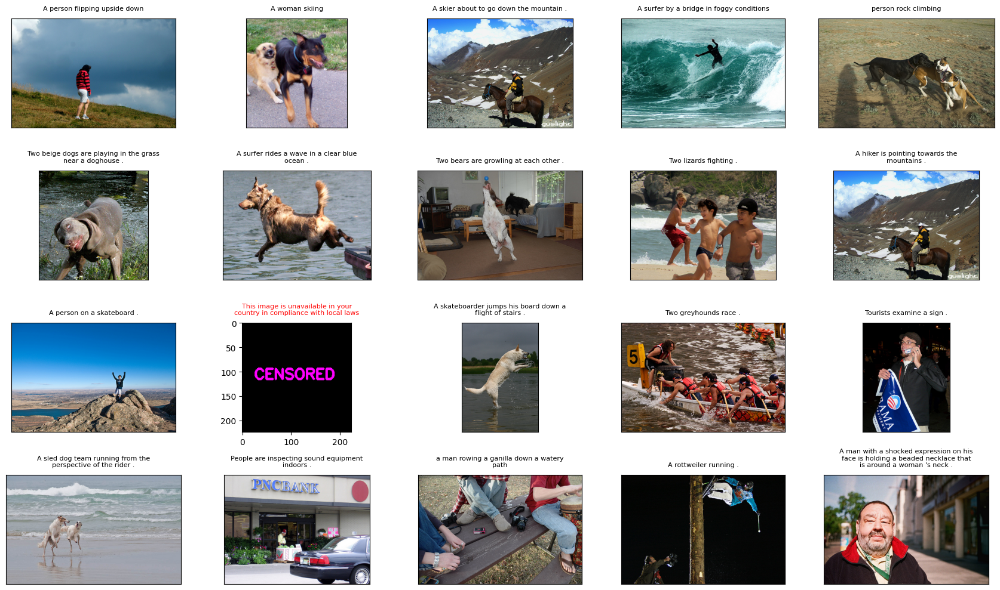

In [53]:
show_examples(test_df)

# Проверка модели на данных, которые модель ещё не видела

In [54]:
# Подготовим набор валидационных данных. У нас есть папка с рисунками и нам надо вязть  случайные 10 запросов из файла test_queries.csv

In [55]:
valid=pd.read_csv('E:/Data/_Projects/datasets/dsplus_integrated_project_4/to_upload/test_queries.csv', sep="|")
valid=valid[['query_text']]
valid=valid.drop_duplicates()
valid.sample(5)

,query_text
82,A playground with two children and an adult .
207,Four people are cavorting on the rocks at a ri...
305,A skier makes the only path on an empty mounta...
327,A tennis player in a blue shirt celebrates his...
112,A white bulldog sitting on a tree stump gives ...


In [56]:
valid=content_filter(valid)
valid=vextrize_description(valid)
valid=valid.sample(20)
valid.sample(5)

e:\Data\_Projects\.git\ISR\image-super-resolution\.venv\lib\site-packages\transformers\tokenization_utils_base.py:2619: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  warnings.warn(


,query_text,lemmatized_query_text,is_censored,text_features
263,An Arabic man in a white hat .,an arabic man in a white hat .,0,"[101, 2019, 5640, 2158, 1999, 1037, 2317, 6045..."
10,Girls wearing sports uniforms and eye protecti...,girls wearing sport uniform and eye protection .,1,"[101, 3057, 4147, 4368, 6375, 1998, 3239, 3860..."
158,People skate in an urban outdoor ice skating rink,people skate in an urban outdoor ice skating rink,0,"[101, 2111, 17260, 1999, 2019, 3923, 7254, 325..."
204,Two dogs walking with their toys .,two dog walking with their toy .,0,"[101, 2048, 3899, 3788, 2007, 2037, 9121, 1012..."
106,A girl on skis in snow .,a girl on ski in snow .,1,"[101, 1037, 2611, 2006, 8301, 1999, 4586, 1012..."


In [57]:
valid_img_df=verctorize_files(dir='E:\\Data\\_Projects\\datasets\\dsplus_integrated_project_4\\to_upload\\test_images\\')
valid_img_df.sample(5)

100%|██████████| 100/100 [00:01<00:00, 80.01it/s]


4/4 - 3s - 3s/epoch - 637ms/step


,img_features,path,file
2,"[0.22410442, 2.0784066, 0.0, 0.27927014, 0.047...",E:\Data\_Projects\datasets\dsplus_integrated_p...,123997871_6a9ca987b1.jpg
15,"[0.6336283, 0.061895747, 0.0, 0.008962082, 0.0...",E:\Data\_Projects\datasets\dsplus_integrated_p...,2201192417_d934730fea.jpg
49,"[0.28960937, 0.6661329, 0.5934656, 0.015029863...",E:\Data\_Projects\datasets\dsplus_integrated_p...,3154152744_4e93ec8a62.jpg
79,"[0.2946129, 0.0, 0.043150008, 0.60557985, 0.37...",E:\Data\_Projects\datasets\dsplus_integrated_p...,3555573680_41c1540a86.jpg
0,"[0.23536614, 2.2142386, 0.061007753, 0.1907599...",E:\Data\_Projects\datasets\dsplus_integrated_p...,1177994172_10d143cb8d.jpg


In [58]:
vdf=pd.DataFrame(columns=['file','query_text','lemmatized_query_text','is_censored','text_features','img_features','path'])
for img in range(len(valid_img_df)):
    for txt in range(len(valid)):
        vdf.loc[len(vdf)]=(pd.Series([valid_img_df.iloc[img]['file'], valid.iloc[txt]['query_text'],valid.iloc[txt]['lemmatized_query_text'],
                                  valid.iloc[txt]['is_censored'],valid.iloc[txt]['text_features'], valid_img_df.iloc[img]['img_features'],valid_img_df.iloc[img]['path']], index=vdf.columns))    

vdf.sample(5)

,file,query_text,lemmatized_query_text,is_censored,text_features,img_features,path
1704,381514859_b40418d9c3.jpg,Three women are dressed in costumes while one ...,three woman are dressed in costume while one h...,0,"[101, 2093, 2450, 2024, 5102, 1999, 9427, 2096...","[0.62897015, 1.2814214, 0.09494506, 0.7933306,...",E:\Data\_Projects\datasets\dsplus_integrated_p...
776,2986716822_e220754d32.jpg,A group of three females and one male dressed ...,a group of three female and one male dressed i...,0,"[101, 1037, 2177, 1997, 2093, 2931, 1998, 2028...","[0.13827853, 0.46787232, 0.063275054, 0.187346...",E:\Data\_Projects\datasets\dsplus_integrated_p...
1632,3653484549_f316590b0f.jpg,Two black dogs fighting over an orange toy .,two black dog fighting over an orange toy .,0,"[101, 2048, 2304, 3899, 3554, 2058, 2019, 4589...","[0.084318034, 0.813184, 0.039317254, 0.8384859...",E:\Data\_Projects\datasets\dsplus_integrated_p...
253,2107838729_a527e434bd.jpg,The young girl is cross-country skiing .,the young girl is cross-country skiing .,1,"[101, 1996, 2402, 2611, 2003, 2892, 1011, 2406...","[0.008639571, 0.5418299, 0.025345778, 0.043180...",E:\Data\_Projects\datasets\dsplus_integrated_p...
1431,3466891862_9afde75568.jpg,Three women are looking into a camera .,three woman are looking into a camera .,0,"[101, 2093, 2450, 2024, 2559, 2046, 1037, 4950...","[2.168491, 0.10862494, 0.49980673, 0.0, 0.3095...",E:\Data\_Projects\datasets\dsplus_integrated_p...


In [59]:
X_text_valid=np.array([np.array(xi) for xi in vdf['text_features']])
X_img_valid=np.array([np.array(xi) for xi in vdf['img_features']])

In [60]:
predz=model.predict([X_img_valid,X_text_valid])
vdf['predict']=predz

63/63 [==============================] - 0s 1ms/step


In [61]:
vdf['query_text'].unique()[:5]

array(['People browse in a store .', 'Two dogs walking with their toys .',
       'a large group of young people all dressed in white tops and green bottoms',
       'A sad looking dog sitting next to shrubs .',
       'Three women are dressed in costumes while one holds an umbrella .'],
      dtype=object)

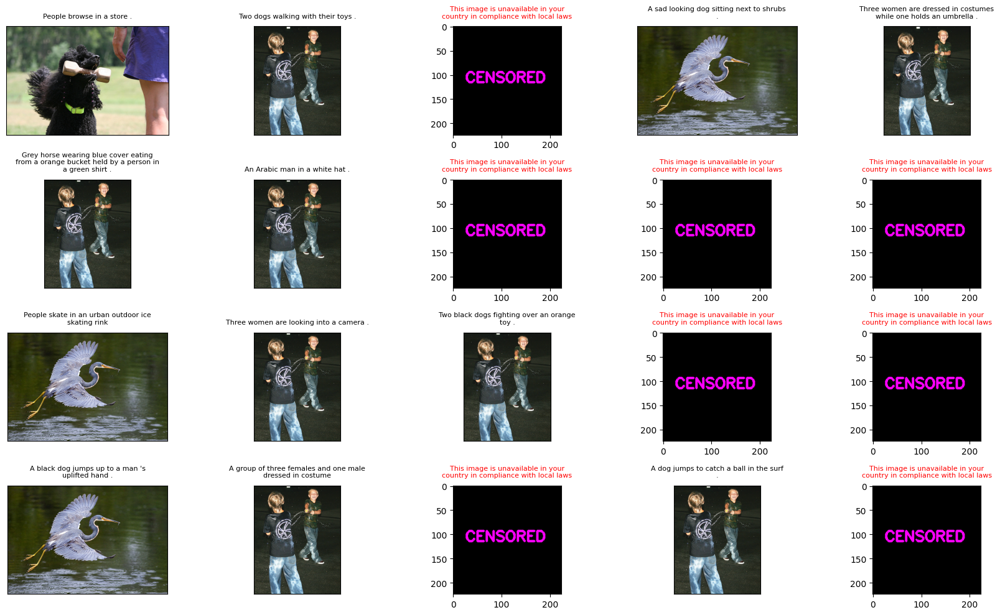

In [62]:
show_examples(vdf)

Результаты нейросети производят крайне удручающее впечатление.  
Теперь посомтрим как будет обрабатывать новые для себя фотографии, модель CatBoostRegressor, показавшая наилучшие результат по МАЕ на тестовой выборке.

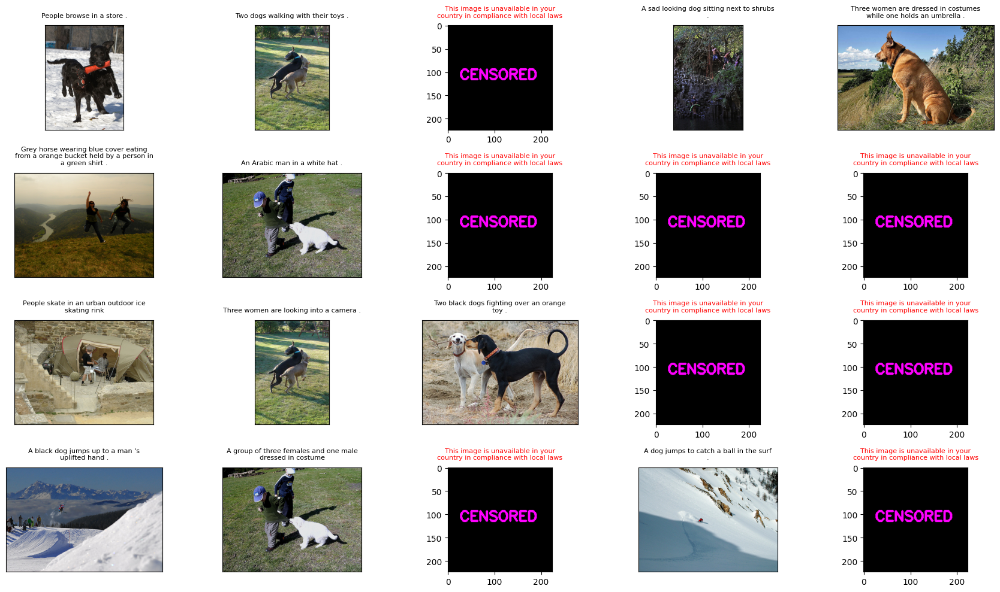

In [63]:
dum_va_X=np.concatenate((X_img_valid,X_text_valid), axis = 1)
dum_va_X=sc.transform(dum_va_X)
y_val_pred=dict_classifiers['CatBoost'].predict(dum_va_X)
vdf['predict']=y_val_pred
show_examples(vdf)

**Вывод:**  
-Результаты на валидационном наборе данных оставляют желать лучшего. Модели пропускаются детский контент, в том случае если ребёнок не указан в описании, предложенных описания походят к картинками лишь в некотрой части и в редких случаях.  
-Для улучшения качества небходимо более глубоко поработать с обучающими данными. Разметить где на картинке есть дети, даже если их нет в текстовом описании, чтобы лучше  работал фильтр.  
-Что-то надо делать с экспертами. Их оценки близки к случайным. Неудивительно, что и модель учится не особенно хорошо.  
-Имеется сильный дисбаланс. Модель видит мало положительных примеров. Хорошо бы расширить набор данных за счёт большего числа картинок с подходящими описаниями.  
-Мы установили, что применение нейростетей не даёт в данной задачи выигрыша ни в скорости обучения, ни в точности предсказания.  
-Обидно, что модель - CatBoost даёт МАЕ хуже чем у прямолинейного алгоритама, который просто берёт медианные значения.